In [1]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt 
import seaborn as sps
%matplotlib inline

In [3]:
trian = pd.read_csv('titanic_train.csv')

In [4]:
trian.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


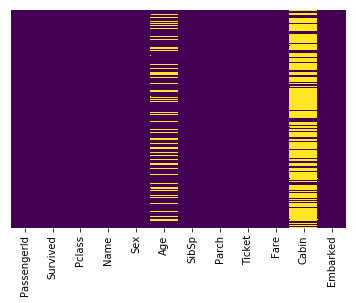

In [5]:
sps.heatmap(trian.isnull(),cbar=False,yticklabels=False,cmap='viridis')

In [6]:
sps.set_style('whitegrid')

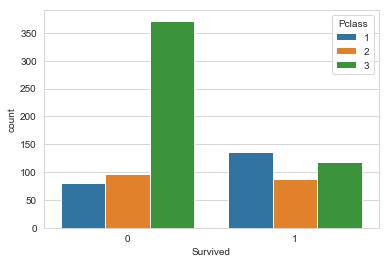

In [7]:
sps.countplot(x = 'Survived',hue='Pclass',data=trian)

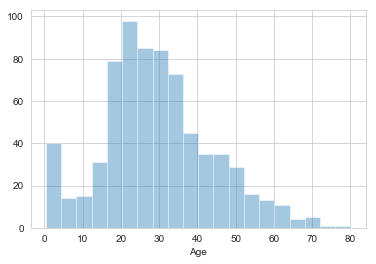

In [8]:
sps.distplot(trian['Age'].dropna(),kde=False,bins=20)

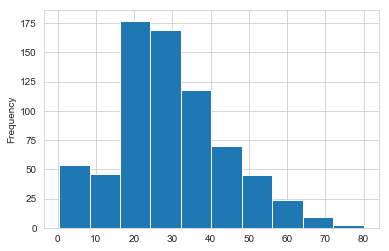

In [9]:
trian['Age'].plot.hist()

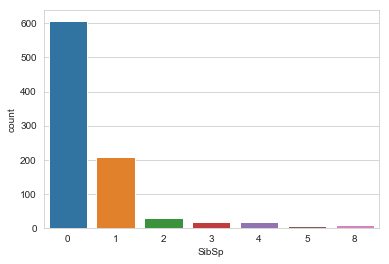

In [10]:
sps.countplot(x='SibSp',data=trian)

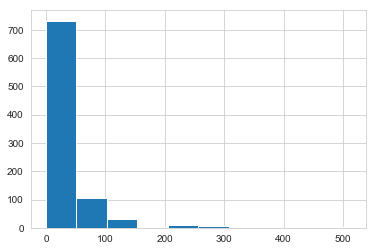

In [11]:
trian['Fare'].hist()

In [12]:
import cufflinks as cf

C:\Program Files (x86)\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:558: DeprecationWarning:

plotly.graph_objs.YAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.YAxis
  - plotly.graph_objs.layout.scene.YAxis


C:\Program Files (x86)\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:531: DeprecationWarning:

plotly.graph_objs.XAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.XAxis
  - plotly.graph_objs.layout.scene.XAxis




In [13]:
cf.go_offline()

In [14]:
#trian['Fare'].iplot(kind='hist',bins=30)

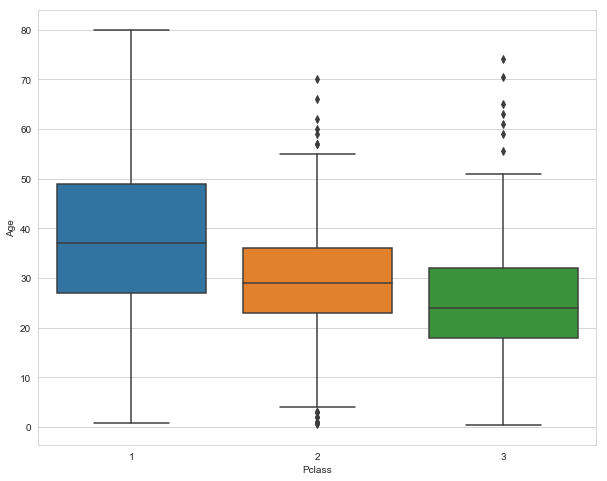

In [15]:
plt.figure(figsize=(10,8))
sps.boxplot(x='Pclass',y='Age',data=trian)

In [16]:
def impute_age(cols):
    Age = cols[0]
    Pclass = cols[1]
    
    if pd.isnull(Age):
        if Pclass == 1:
            return 39
        elif Pclass == 2:
            return 29
        else:
            return 24
    else:
        return Age

In [17]:
trian['Age'] = trian[['Age','Pclass']].apply(impute_age,axis=1)

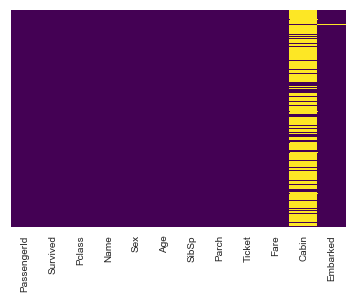

In [18]:
sps.heatmap(trian.isnull(),cbar=False,yticklabels=False,cmap='viridis')

In [19]:
trian.drop('Cabin',axis=1,inplace=True)

In [20]:
trian.dropna(inplace=True)

In [21]:
Sex = pd.get_dummies(trian['Sex'],drop_first=1)

In [22]:
Embarked = pd.get_dummies(trian['Embarked'],drop_first=1)

In [23]:
trian = pd.concat((trian,Sex,Embarked),axis=1)
trian.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,male,Q,S
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S,1,0,1
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C,0,0,0
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S,0,0,1
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S,0,0,1
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S,1,0,1


In [24]:
trian.drop(['Sex','Embarked','Name','Ticket'],inplace=True,axis=1)
trian.head()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,male,Q,S
0,1,0,3,22.0,1,0,7.2500,1,0,1
1,2,1,1,38.0,1,0,71.2833,0,0,0
2,3,1,3,26.0,0,0,7.9250,0,0,1
3,4,1,1,35.0,1,0,53.1000,0,0,1
4,5,0,3,35.0,0,0,8.0500,1,0,1


In [25]:
trian.drop('PassengerId',inplace=True,axis=1)

In [26]:
trian.head()

,Survived,Pclass,Age,SibSp,Parch,Fare,male,Q,S
0,0,3,22.0,1,0,7.2500,1,0,1
1,1,1,38.0,1,0,71.2833,0,0,0
2,1,3,26.0,0,0,7.9250,0,0,1
3,1,1,35.0,1,0,53.1000,0,0,1
4,0,3,35.0,0,0,8.0500,1,0,1


In [30]:
X = trian.drop('Survived',axis=1)
y = trian['Survived']

In [31]:
from sklearn.cross_validation import train_test_split

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [37]:
from sklearn.linear_model import LogisticRegression

In [38]:
kogmodel = LogisticRegression()

In [39]:
kogmodel.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [41]:
prediction = kogmodel.predict(X_test)

In [42]:
from sklearn.metrics import classification_report

In [44]:
print(classification_report(y_test,prediction))

             precision    recall  f1-score   support

          0       0.80      0.91      0.85       163
          1       0.82      0.65      0.73       104

avg / total       0.81      0.81      0.80       267



In [45]:
from sklearn.metrics import confusion_matrix

In [46]:
confusion_matrix(y_test,prediction)

array([[148,  15],
       [ 36,  68]], dtype=int64)

In [1]:
"_____________________________________________________________________________________________________________________"

'_____________________________________________________________________________________________________________________'

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sps
%matplotlib inline

In [4]:
ad_data = pd.read_csv('advertising.csv')

In [5]:
ad_data.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Ad Topic Line,City,Male,Country,Timestamp,Clicked on Ad
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,2016-03-27 00:53:11,0
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,2016-04-04 01:39:02,0
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,2016-03-13 20:35:42,0
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,2016-01-10 02:31:19,0
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,2016-06-03 03:36:18,0


In [6]:
ad_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 10 columns):
Daily Time Spent on Site    1000 non-null float64
Age                         1000 non-null int64
Area Income                 1000 non-null float64
Daily Internet Usage        1000 non-null float64
Ad Topic Line               1000 non-null object
City                        1000 non-null object
Male                        1000 non-null int64
Country                     1000 non-null object
Timestamp                   1000 non-null object
Clicked on Ad               1000 non-null int64
dtypes: float64(3), int64(3), object(4)
memory usage: 78.2+ KB


In [7]:
ad_data.describe()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,65.000200,36.009000,55000.000080,180.000100,0.481000,0.50000
std,15.853615,8.785562,13414.634022,43.902339,0.499889,0.50025
min,32.600000,19.000000,13996.500000,104.780000,0.000000,0.00000
25%,51.360000,29.000000,47031.802500,138.830000,0.000000,0.00000
50%,68.215000,35.000000,57012.300000,183.130000,0.000000,0.50000
75%,78.547500,42.000000,65470.635000,218.792500,1.000000,1.00000
max,91.430000,61.000000,79484.800000,269.960000,1.000000,1.00000


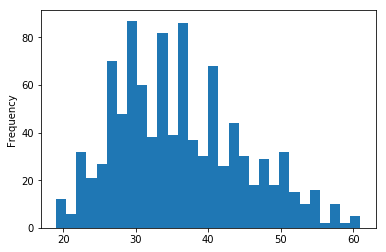

In [25]:
ad_data['Age'].plot.hist(bins=30)

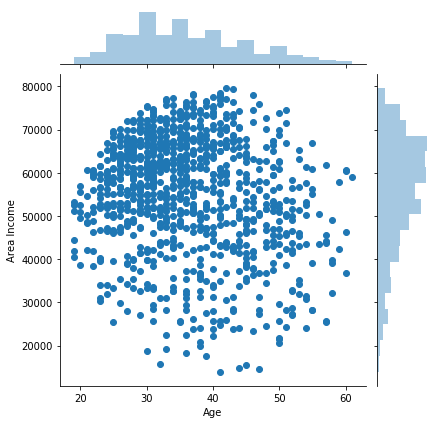

In [31]:
sps.jointplot(x=ad_data['Age'],y=ad_data['Area Income'])

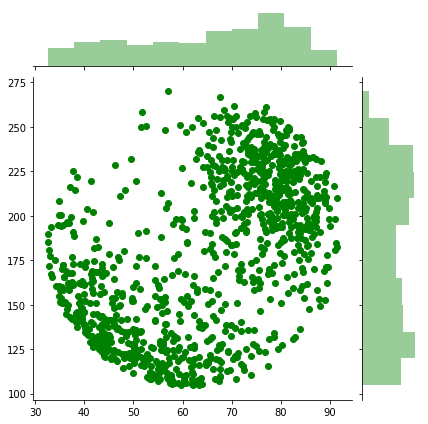

In [35]:
sps.jointplot(x=['Daily Time Spent on Site'],y=['Daily Internet Usage'],data=ad_data,color='g')

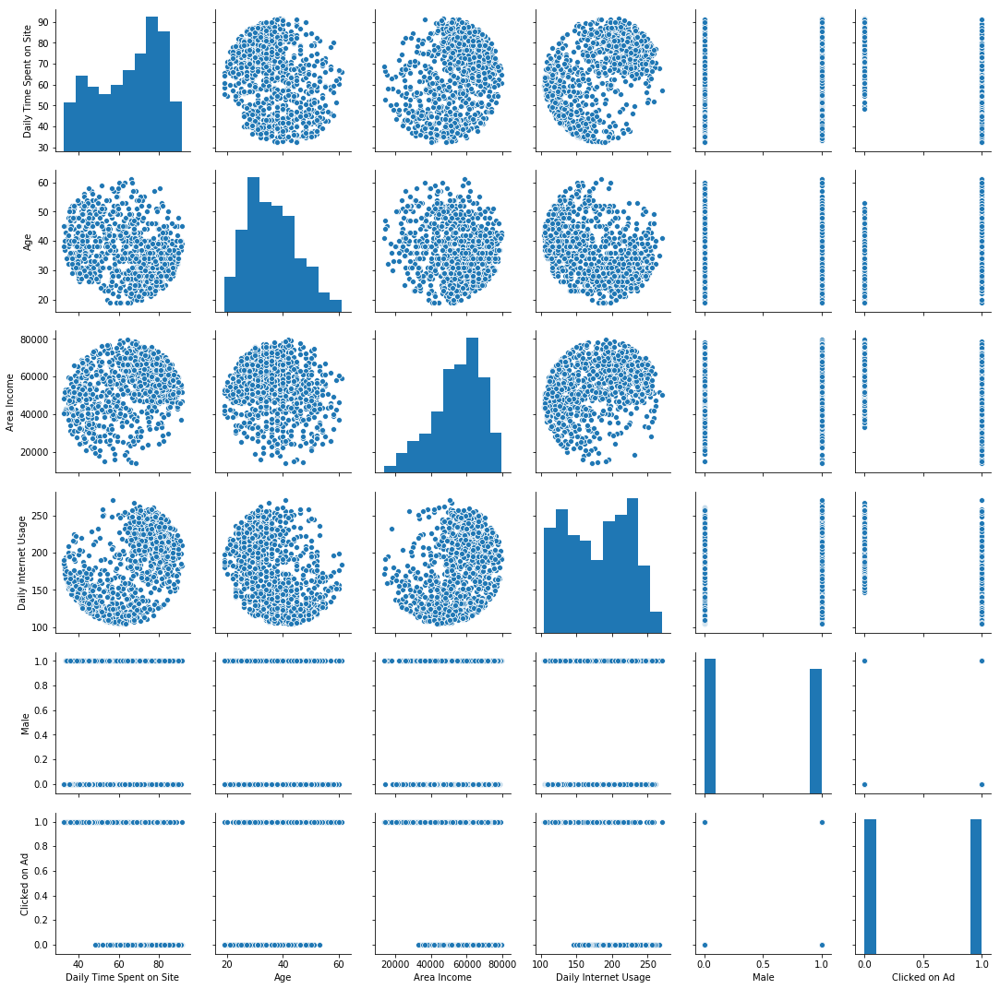

In [36]:
sps.pairplot(ad_data)

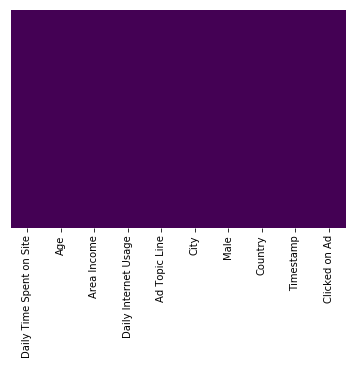

In [58]:
sps.heatmap(ad_data.isnull(),cbar=False,yticklabels=False,cmap='viridis')

In [70]:
ad_data.drop(['Ad Topic Line','City','Country','Timestamp'],inplace=True,axis=1)
ad_data.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad
0,68.95,35,61833.90,256.09,0,0
1,80.23,31,68441.85,193.77,1,0
2,69.47,26,59785.94,236.50,0,0
3,74.15,29,54806.18,245.89,1,0
4,68.37,35,73889.99,225.58,0,0


In [77]:
X = ad_data.drop('Male',axis=1)
y = ad_data['Male']

In [78]:
from sklearn.cross_validation import train_test_split

In [79]:
 X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [80]:
from sklearn.linear_model import LogisticRegression

In [81]:
kogmodel = LogisticRegression()

In [82]:
kogmodel.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [83]:
predction = kogmodel.predict(X_test)

In [84]:
from sklearn.metrics import classification_report

In [85]:
print(classification_report(y_test,predction))

             precision    recall  f1-score   support

          0       0.55      0.70      0.62       160
          1       0.50      0.34      0.41       140

avg / total       0.53      0.53      0.52       300

